In [4]:
from collections import Counter
from datetime import datetime
import json

from nltk.corpus import stopwords
from wordcloud import WordCloud
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pyLDAvis.gensim
import pyLDAvis
import pandas as pd
import numpy as np
import gensim
import folium
import spacy
import nltk

In [ ]:
nltk.download('stopwords')

In [0]:
def get_df(path):
    with open(path) as f:
        content = f.readlines()
    content_dict = [json.loads(c) for c in content]
    return pd.DataFrame(content_dict)

In [0]:
london_df = get_df("data/geoLondonApr2020-1")
ny_df = get_df("data/geoNewYorkCityApr2020-1")

In [0]:
print(london_df.shape)
print(ny_df.shape)

(7351, 14)
(10624, 14)


In [0]:
# Remove Z at the end, used for UTC
get_date = lambda x: datetime.fromisoformat(x["$date"][:-1])
london_df["date"] = london_df["date"].apply(get_date)
ny_df["date"] = ny_df["date"].apply(get_date)

In [0]:
# Remove 10 samples from 2020-04-18
# Because there is no sample between 2020-04-14 and 04-18
london_df = london_df.iloc[:-10]

## Source of data

In [0]:
london_df["source"].value_counts(normalize=True).head()

Instagram        0.900014
dlvr.it          0.043531
CareerArc 2.0    0.015508
Squarespace      0.009931
everybot         0.009523
Name: source, dtype: float64

In [0]:
ny_df["source"].value_counts(normalize=True).head()

Instagram        0.745576
511NY-Tweets     0.100339
Squarespace      0.070877
CareerArc 2.0    0.028991
NYTransit        0.018543
Name: source, dtype: float64

Most of the data comes from Instagram

## When and how frequent people post

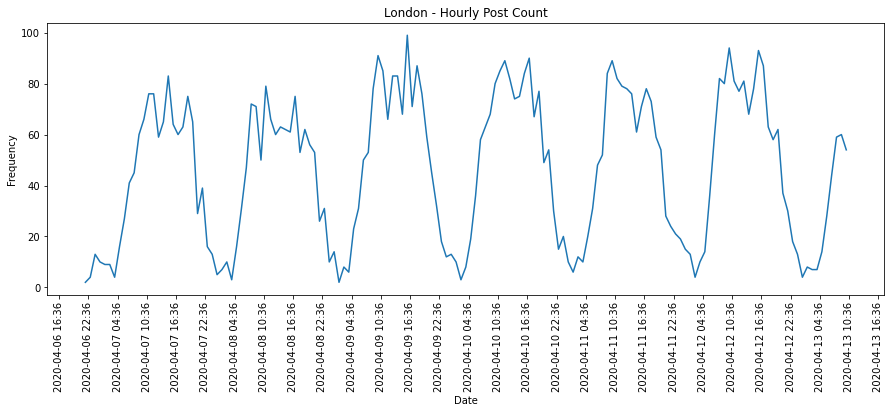

In [0]:
fig, ax = plt.subplots(figsize=(15, 5))
temp = london_df.assign(count=1).resample("H", on="date")["count"].sum()
plt.plot(temp.index, temp.values)
plt.title("London - (2)Hourly Post Count")
plt.ylabel("Frequency")
plt.xlabel("Date")
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=60*6))
plt.xticks(rotation=90);

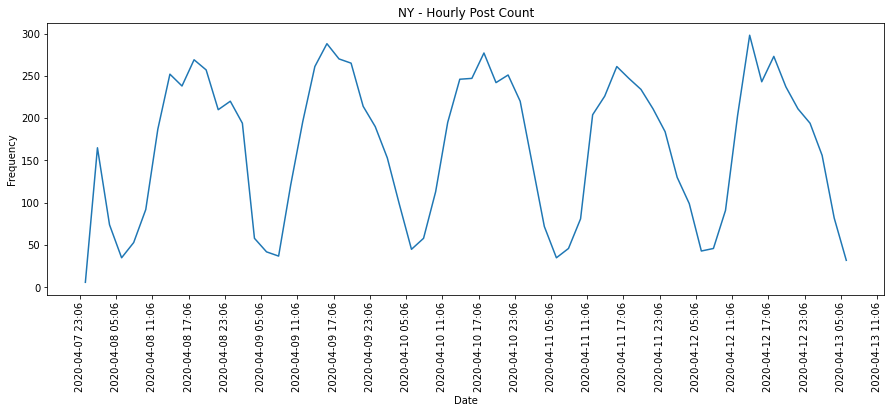

In [0]:
fig, ax = plt.subplots(figsize=(15, 5))
temp = ny_df.assign(count=1).resample("2H", on="date")["count"].sum()
plt.plot(temp.index, temp.values)
plt.title("NY - (2)Hourly Post Count")
plt.ylabel("Frequency")
plt.xlabel("Date")
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=60*6))
plt.xticks(rotation=90);

## Which tags they use

In [0]:
def plot_word_cloud(series, title):
    all_tokens = [i.lower().strip() for sl in series.values for i in sl]
    text = " ".join(all_tokens)
    wordcloud = WordCloud(width=1000, height=600,
                          background_color="white",
                          random_state=0)
    wordcloud.generate(text)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(title)

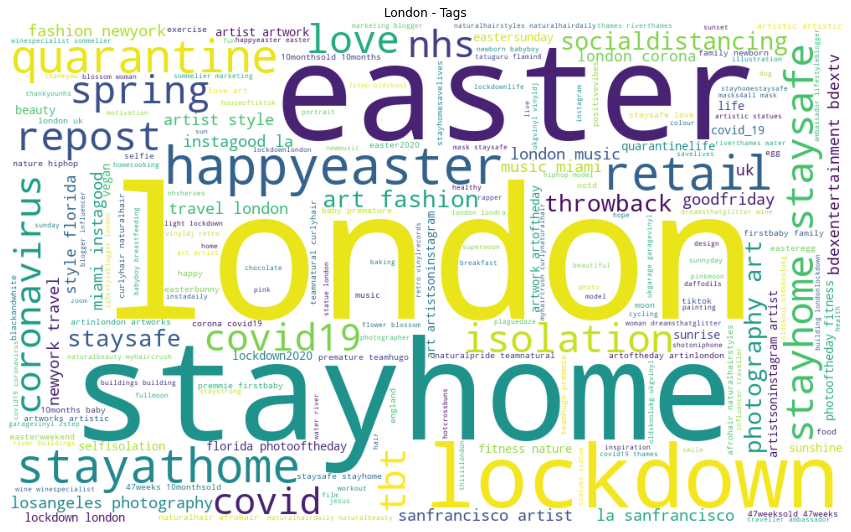

In [0]:
plt.figure(figsize=(15,10))
plot_word_cloud(london_df["hashtags"], "London - Tags")

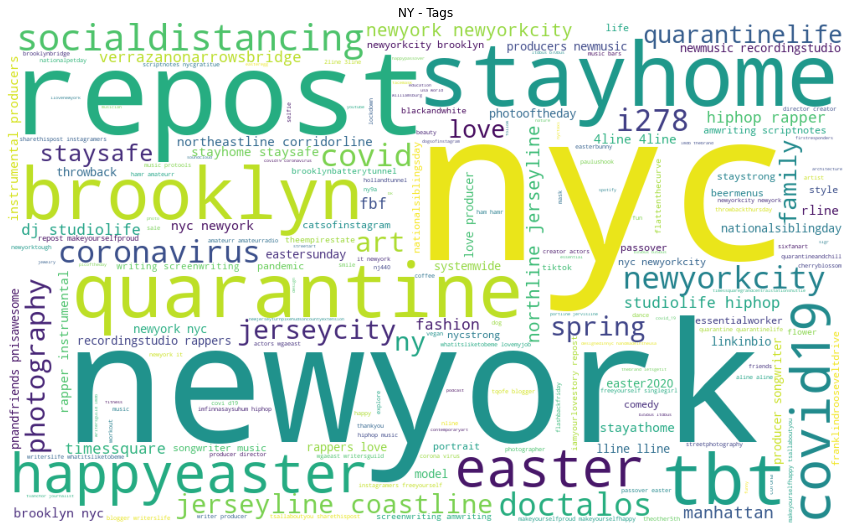

In [0]:
plt.figure(figsize=(15,10))
plot_word_cloud(ny_df["hashtags"], "NY - Tags")

In [0]:
def get_tag_trend(df, tag):
    is_in_list = lambda x, i: i in x
    temp = df[df["hashtags"].apply(is_in_list, i=tag)]
    return temp.assign(count=1).resample("2H", on="date")["count"].sum()

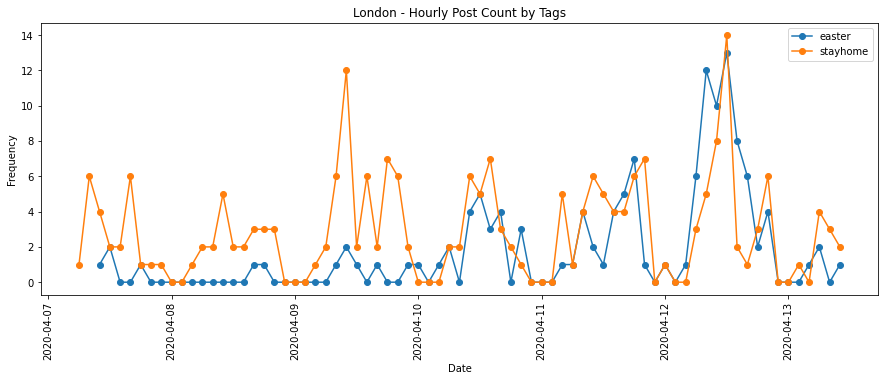

In [0]:
plt.figure(figsize=(15,5))

tags = ["easter", "stayhome"]
for tag in tags:  
    temp = get_tag_trend(london_df, tag)
    plt.plot(temp.index, temp.values, label=tag, marker="o")

plt.title("London - Hourly Post Count by Tags")
plt.ylabel("Frequency")
plt.xlabel("Date")
plt.legend()
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=60*6))
plt.xticks(rotation=90);

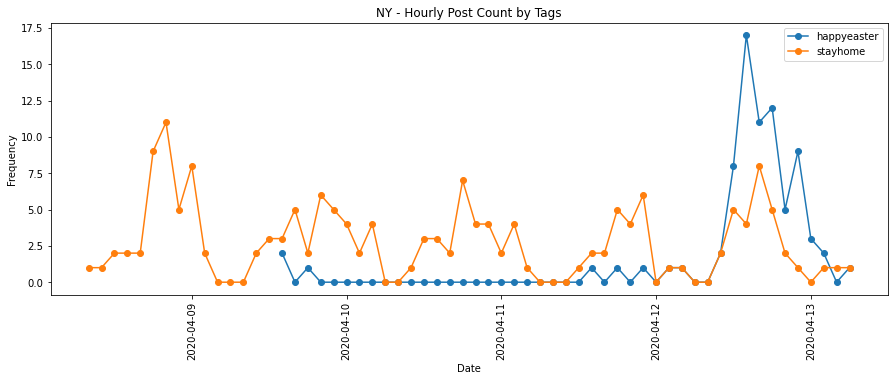

In [0]:
plt.figure(figsize=(15,5))

tags = ["happyeaster", "stayhome"]
for tag in tags:  
    temp = get_tag_trend(ny_df, tag)
    plt.plot(temp.index, temp.values, label=tag, marker="o")

plt.title("NY - Hourly Post Count by Tags")
plt.ylabel("Frequency")
plt.xlabel("Date")
plt.legend()
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d %H:%M"))
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=60*6))
plt.xticks(rotation=90);

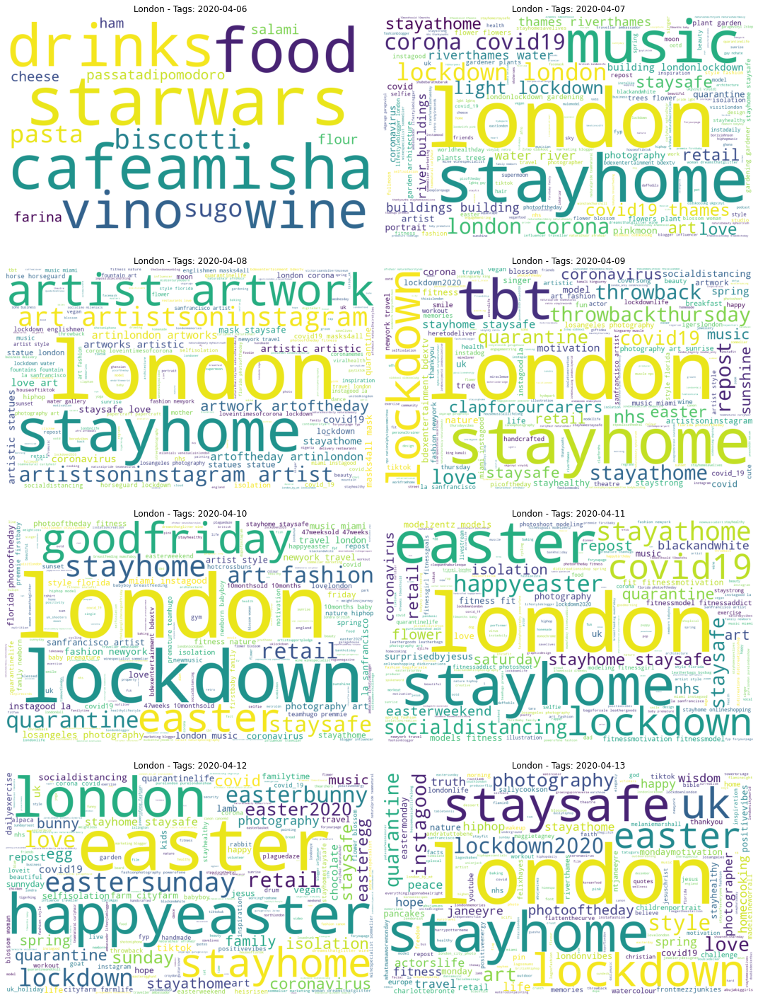

In [0]:
plt.figure(figsize=(15,20))
for i, dt in enumerate(london_df["date"].dt.date.unique()):
    plt.subplot(4, 2, i+1)
    temp = london_df[london_df["date"].dt.date == dt]
    plot_word_cloud(temp["hashtags"], "London - Tags: "+str(dt))
plt.tight_layout()

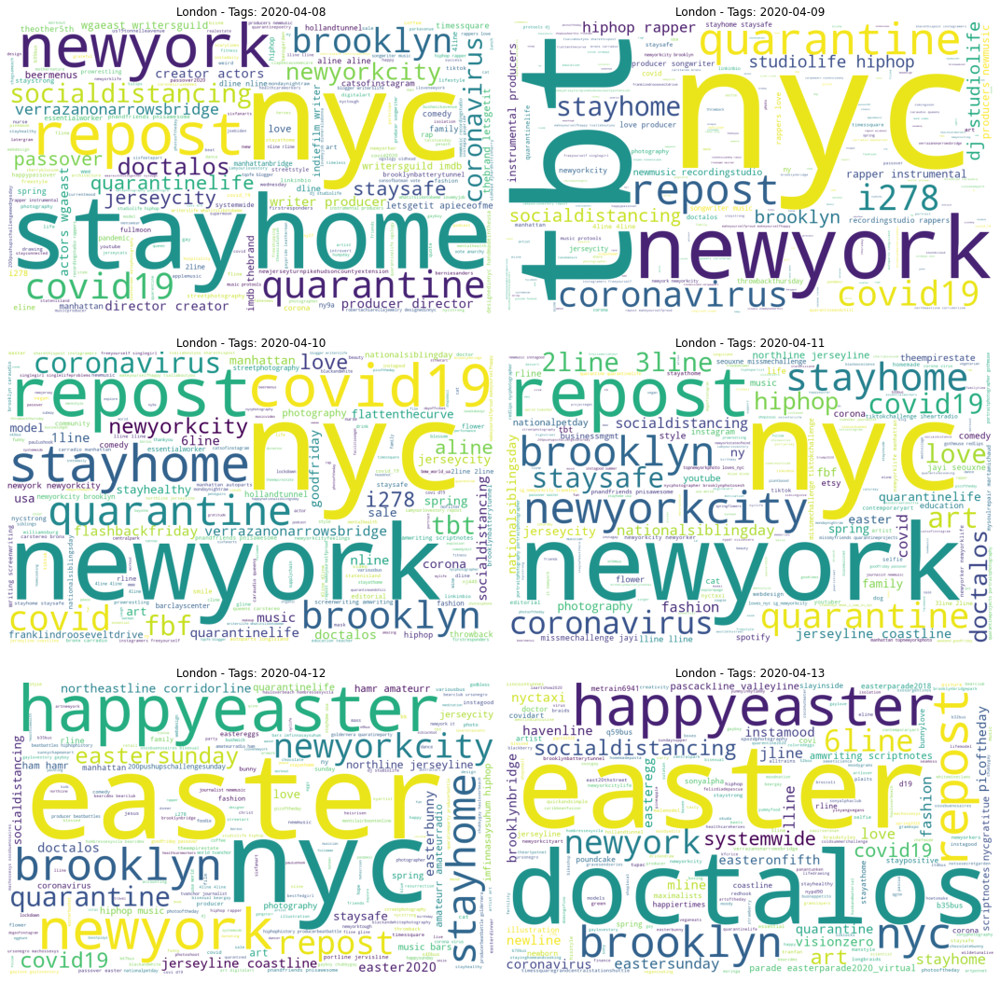

In [0]:
plt.figure(figsize=(15,15))
for i, dt in enumerate(ny_df["date"].dt.date.unique()):
    plt.subplot(3, 2, i+1)
    temp = ny_df[ny_df["date"].dt.date == dt]
    plot_word_cloud(temp["hashtags"], "London - Tags: "+str(dt))
plt.tight_layout()

- Tags are mostly well-known days or things like easter, national siblings day, lockdown
- Tags are usually words used while posting a photo (as most of the data comes from instagram)

## From where they post

In [0]:
change_index = lambda x: [x[-1], x[0]]
london_df["coordinates"] = london_df["coordinates"].apply(change_index)
ny_df["coordinates"] = ny_df["coordinates"].apply(change_index)

In [0]:
get_ax = lambda x, i: x[i]

m = folium.Map(
    location=[london_df["coordinates"].apply(get_ax, i=0).mean(),
              london_df["coordinates"].apply(get_ax, i=1).mean()],
    zoom_start=10,
    tiles='Stamen Terrain'
)

for _, r in london_df.iterrows():
    folium.Circle(radius=1, fill=True, color="red",
                  location=r["coordinates"]).add_to(m)

m

In [0]:
m = folium.Map(
    location=[ny_df["coordinates"].apply(get_ax, i=0).mean(),
              ny_df["coordinates"].apply(get_ax, i=1).mean()],
    zoom_start=10,
    tiles='Stamen Terrain'
)

for _, r in ny_df.iterrows():
    folium.Circle(radius=1, fill=True, color="red",
                  location=r["coordinates"]).add_to(m)

m

In [0]:
stop_words = set(stopwords.words("english"))

In [0]:
nlp = spacy.load("en")
nlp.remove_pipe('tagger')
nlp.remove_pipe('parser');

In [0]:
def tokenize_normalize(string):
    tokens = []
    doc = nlp(string)
    for token in doc:
        if ((token.is_alpha or token.is_digit)
                and token.lemma_ != "-PRON-"
                and token.lemma_ not in stop_words
                and len(token.lemma_) > 3):
            normalized = token.lemma_.lower().strip()
            tokens.append(normalized)
    return tokens

## Most frequent words

In [0]:
texts = london_df["text"].apply(tokenize_normalize).values
words = [word for text in texts for word in text]
counts = Counter(words)
print(counts.most_common(20))

[('london', 2874), ('united', 1752), ('kingdom', 1742), ('easter', 908), ('time', 596), ('much', 569), ('happy', 566), ('today', 447), ('make', 442), ('lockdown', 425), ('love', 409), ('home', 408), ('this', 400), ('good', 398), ('like', 385), ('live', 346), ('work', 309), ('post', 303), ('take', 285), ('stay', 271)]


In [0]:
texts = ny_df["text"].apply(tokenize_normalize).values
words = [word for text in texts for word in text]
counts = Counter(words)
print(counts.most_common(20))

[('york', 4900), ('brooklyn', 1553), ('station', 994), ('incident', 859), ('street', 819), ('easter', 704), ('happy', 628), ('time', 619), ('city', 569), ('much', 545), ('post', 543), ('love', 535), ('photo', 506), ('just', 499), ('like', 481), ('avenue', 474), ('this', 472), ('today', 464), ('make', 445), ('cleared', 415)]


## Clustering (Latent Dirichlet Allocation)

Scikit's LDA is buggy see [issue](https://github.com/scikit-learn/scikit-learn/issues/6777)

In [0]:
def compute_coherence(dictionary, corpus, texts, topic_nums):
    coherence = []
    for num_topics in tqdm(topic_nums):
        model = gensim.models.ldamodel.LdaModel(corpus, num_topics=num_topics, random_state=0,
                                                id2word=dictionary, passes=20)
        coherencemodel = gensim.models.CoherenceModel(model=model, texts=texts,
                                                      dictionary=dictionary, coherence="c_v")
        coherence.append(coherencemodel.get_coherence())
    return coherence

### For London

In [0]:
texts = london_df["text"].apply(tokenize_normalize).values
# bigram
phrases = gensim.models.phrases.Phrases(texts)
bigram = gensim.models.phrases.Phraser(phrases)
texts = [bigram[text] for text in texts]

dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

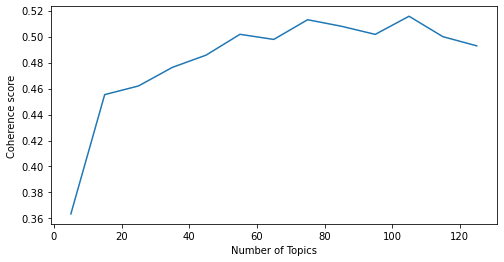

In [0]:
topic_nums = range(5, 130, 10)
coherence = compute_coherence(dictionary, corpus, texts, topic_nums)
plt.figure(figsize=(8, 4))
plt.plot(topic_nums, coherence)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")
plt.show()

In [0]:
pyLDAvis.enable_notebook()
lda = gensim.models.ldamodel.LdaModel(corpus, num_topics=55, id2word=dictionary, passes=20, random_state=0)
pyLDAvis.display(pyLDAvis.gensim.prepare(lda, corpus, dictionary, mds="tsne"))

Some noticeable topics: 3: good wishes 7: cooking/food, 4: working, 10: movie, 12: easter, 5: morning walk, 15: quarantine, 46: workout, 16: tv series,  38: stay home/safe

### For NY

In [0]:
texts = ny_df["text"].apply(tokenize_normalize).values
# bigram
phrases = gensim.models.phrases.Phrases(texts)
bigram = gensim.models.phrases.Phraser(phrases)
texts = [bigram[text] for text in texts]

dictionary = gensim.corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

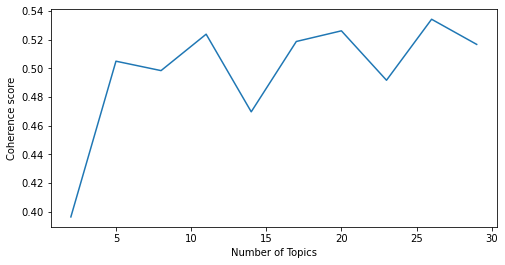

In [0]:
topic_nums = range(2, 30, 3)
coherence = compute_coherence(dictionary, corpus, texts, topic_nums)
plt.figure(figsize=(8, 4))
plt.plot(topic_nums, coherence)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")
plt.show()

In [0]:
pyLDAvis.enable_notebook()
lda = gensim.models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary, passes=20, random_state=0)
pyLDAvis.display(pyLDAvis.gensim.prepare(lda, corpus, dictionary, mds="tsne"))

"Incident" is an important word for 1, 4 and 5

In [0]:
texts = ny_df["text"].apply(tokenize_normalize)
ny_df[texts.apply(lambda x: "incident" in x)]["source"].value_counts()

511NY-Tweets    728
NYTransit       131
Name: source, dtype: int64

- 511NY-Tweets and NYTransit are sources (having "incident" word in their posts) reporting traffic related incidents
- From previous analysis we know 10 percent of posts come from 511NY-Tweets